# Unit 4.3a Parallel Computing
> Observe an algorithm using parallel computing in Python Code.  Monitor processes on host.
- toc: true
- week: 28

## Analyzing Parallel Computing
> Once again we will use image lab, this time to review Parallel Computing.
- Change baseWidth in this line in code to increase computation requirements: ```def process_image(image, baseWidth=512):```  For instance 320, 512, 1024, 2048, 4096.
- Compare Sequential and Parallel computing code and time to achieve outputs

In [6]:
from IPython.display import HTML, display
from pathlib import Path  # https://medium.com/@ageitgey/python-3-quick-tip-the-easy-way-to-deal-with-file-paths-on-windows-mac-and-linux-11a072b58d5f
from PIL import Image as pilImage # as PIL Image is used to avoid conflicts
from io import BytesIO
import base64
import numpy as np


# prepares a series of images
def image_data(path=Path("images/"), images=None):  # path of static images is defaulted
    if images is None:  # default image
        images = [
            {'source': "Internet", 'label': "Green Square", 'file': "green-square-16.png"},
            {'source': "Peter Carolin", 'label': "Clouds Impression", 'file': "clouds-impression.png"},
            {'source': "Peter Carolin", 'label': "Lassen Volcano", 'file': "lassen-volcano.jpg"}
        ]
    for image in images:
        # File to open
        image['filename'] = path / image['file']  # file with path
    return images

# Scale to baseWidth
def scale_image(img, baseWidth):
    scalePercent = (baseWidth/float(img.size[0]))
    scaleHeight = int((float(img.size[1])*float(scalePercent)))
    scale = (baseWidth, scaleHeight)
    return img.resize(scale)

# PIL image converted to base64
def image_to_base64(img, format):
    with BytesIO() as buffer:
        img.save(buffer, format)
        return base64.b64encode(buffer.getvalue()).decode()
    
# Convert pixels to Grey Scale
def grey_pixel(pixel):
    average = (pixel[0] + pixel[1] + pixel[2]) // 3  # average pixel values and use // for integer division
    if len(pixel) > 3:
        return( (average, average, average, pixel[3]) ) # PNG format
    else:
        return( (average, average, average) )
    
# Convert pixels to Red Scale
def red_pixel(pixel):
    if len(pixel) > 3:
        return( (pixel[0], 0, 0, pixel[3]) ) # PNG format
    else:
        return( (pixel[0], 0, 0) )
    
# Convert pixels to Red Scale
def green_pixel(pixel):
    if len(pixel) > 3:
        return( (0, pixel[1], 0, pixel[3]) ) # PNG format
    else:
        return( (0, pixel[1], 0) )
    
# Convert pixels to Red Scale
def blue_pixel(pixel):
    if len(pixel) > 3:
        return( (0, 0, pixel[2], pixel[3]) ) # PNG format
    else:
        return( (0, 0, pixel[2]) )
        
# Set Properties of Image, Scale, and convert to Base64
def image_management(image, baseWidth):  # path of static images is defaulted        
    # Image open return PIL image object
    img = pilImage.open(image['filename'])
    
    # Python Image Library operations
    image['format'] = img.format
    image['mode'] = img.mode
    image['size'] = img.size
    # Scale the Image
    img = scale_image(img, baseWidth)
    image['pil'] = img
    image['scaled_size'] = img.size
    image['numpy'] = np.array(img.getdata())
    # Scaled HTML
    image['html'] = '<img src="data:image/png;base64,%s">' % image_to_base64(image['pil'], image['format'])
    
    # Grey HTML
    # each pixel in numpy array is turned to grey 
    # then resulting list, using List Comprehension, is put back into img    
    img.putdata([grey_pixel(pixel) for pixel in image['numpy']])
    image['html_grey'] =  '<img src="data:image/png;base64,%s">' % image_to_base64(img, image['format'])
    
    # Red HTML
    img.putdata([red_pixel(pixel) for pixel in image['numpy']])
    image['html_red'] =  '<img src="data:image/png;base64,%s">' % image_to_base64(img, image['format'])
    
    # Green HTML
    img.putdata([green_pixel(pixel) for pixel in image['numpy']])
    image['html_green'] =  '<img src="data:image/png;base64,%s">' % image_to_base64(img, image['format'])
    
    # Blue HTML
    img.putdata([blue_pixel(pixel) for pixel in image['numpy']])
    image['html_blue'] =  '<img src="data:image/png;base64,%s">' % image_to_base64(img, image['format'])
    
    
def process_image(image, baseWidth=2048):
    image_management(image, baseWidth)
    print("---- meta data -----")
    print(image['label'])
    print(image['source'])
    print(image['format'])
    print(image['mode'])
    print("Original size: ", image['size'])
    print("Scaled size: ", image['scaled_size'])
    
    print("-- images --")
    display(HTML(image['html'])) 
    display(HTML(image['html_grey'])) 
    display(HTML(image['html_red'])) 
    display(HTML(image['html_green'])) 
    display(HTML(image['html_blue'])) 


## Sequential Processing 
> The for loop iterates over the list of images and processes them one at a time, in order.

---- meta data -----
Green Square
Internet
PNG
RGBA
Original size:  (16, 16)
Scaled size:  (2048, 2048)
-- images --



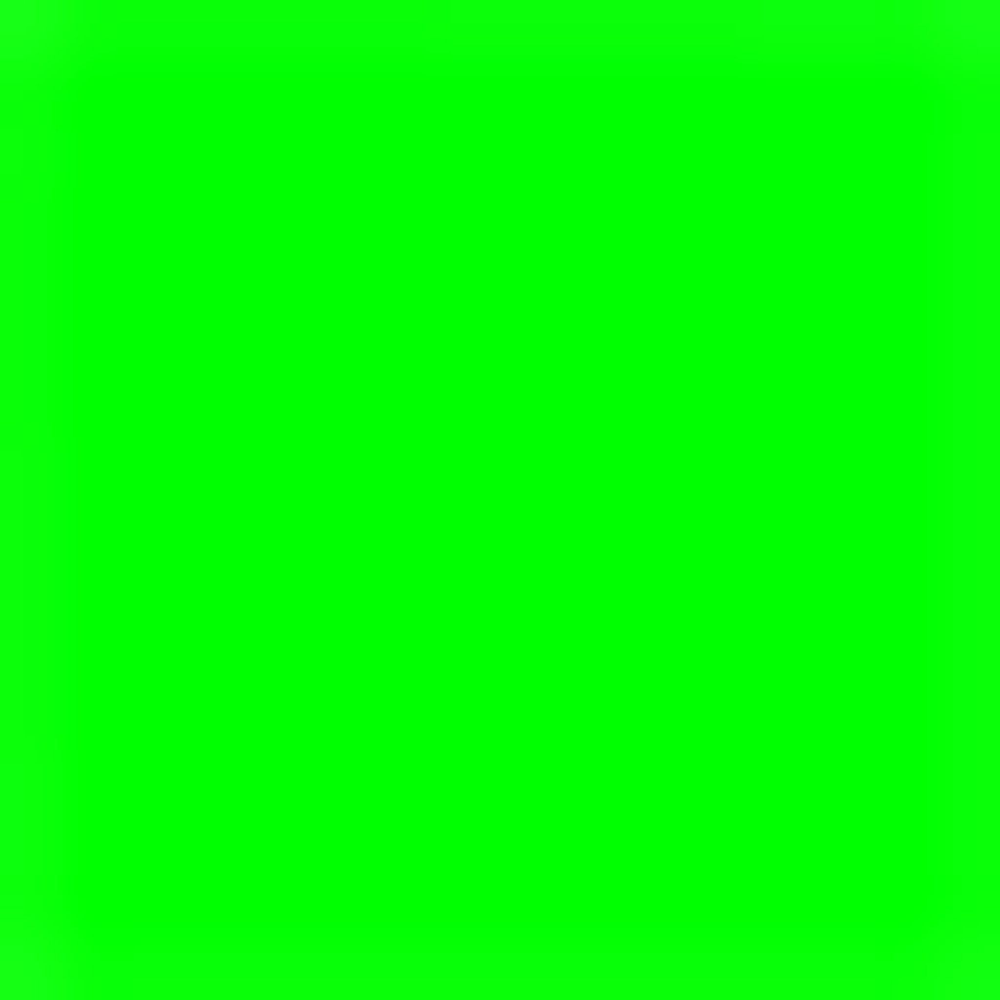


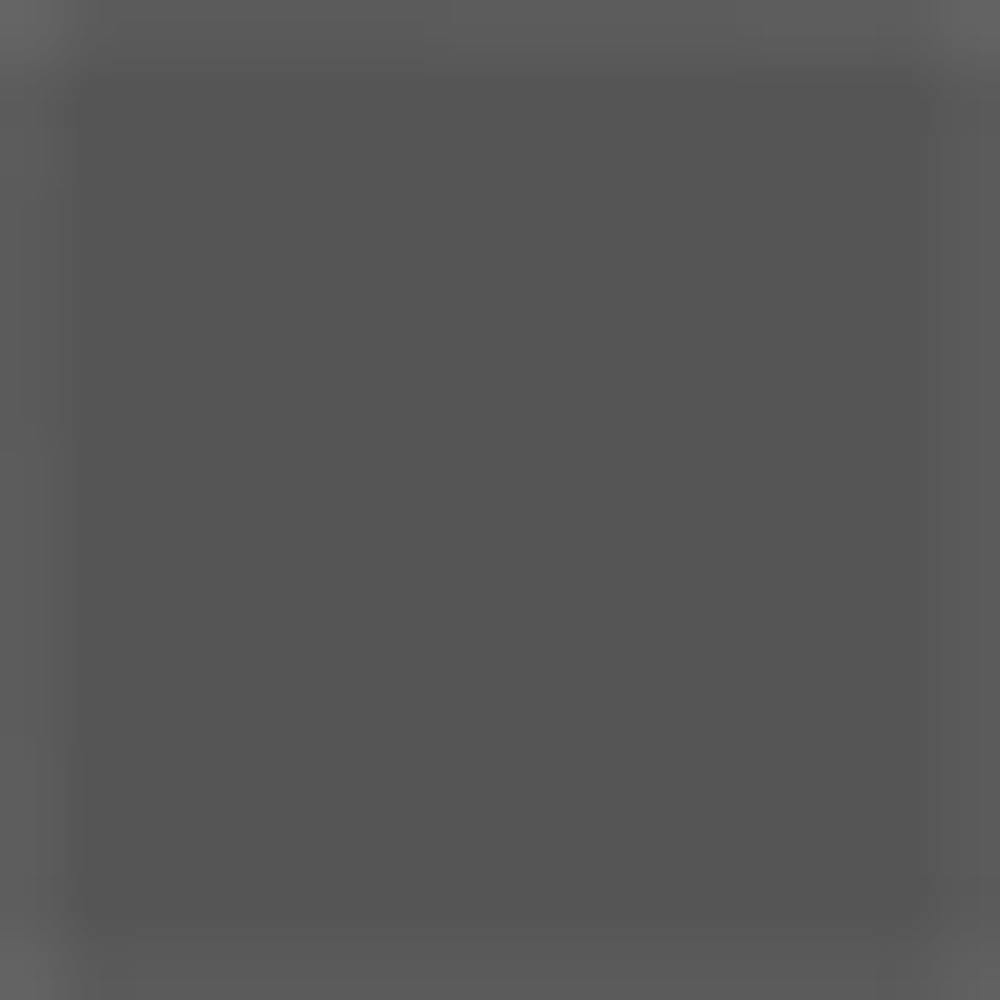


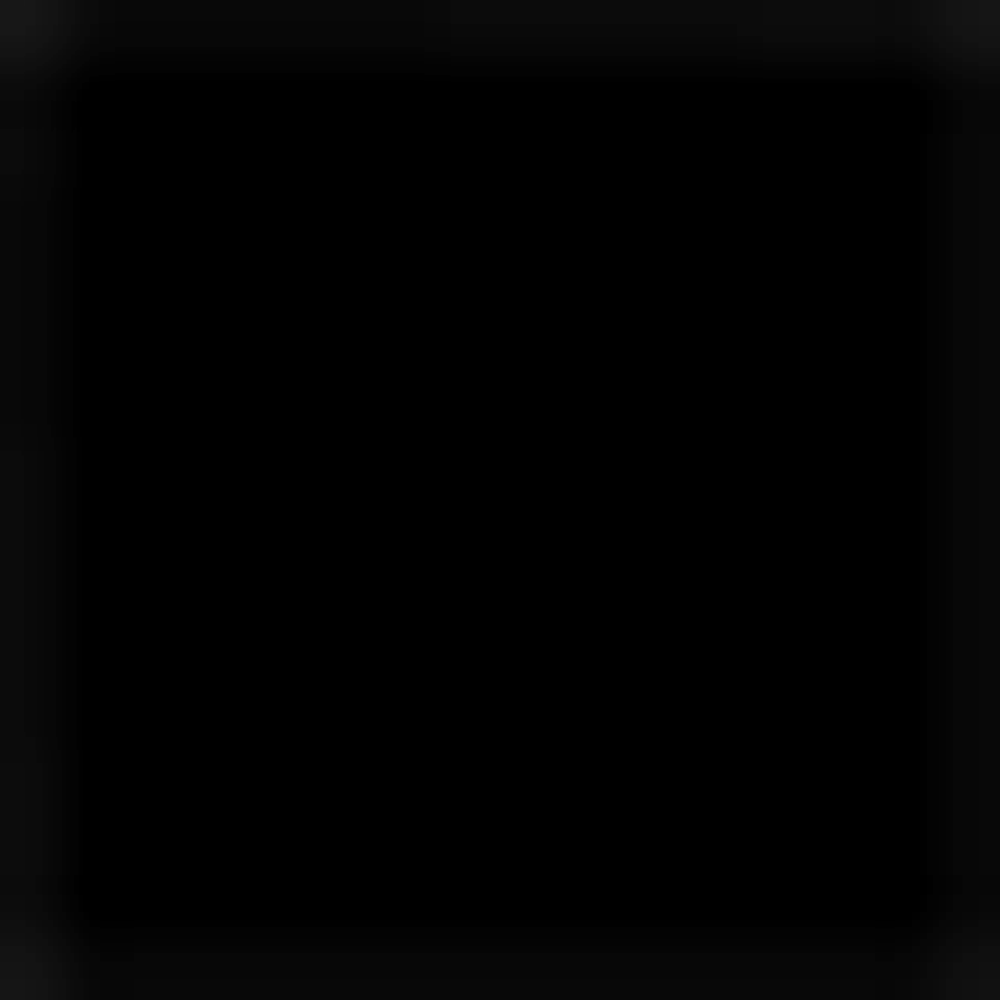


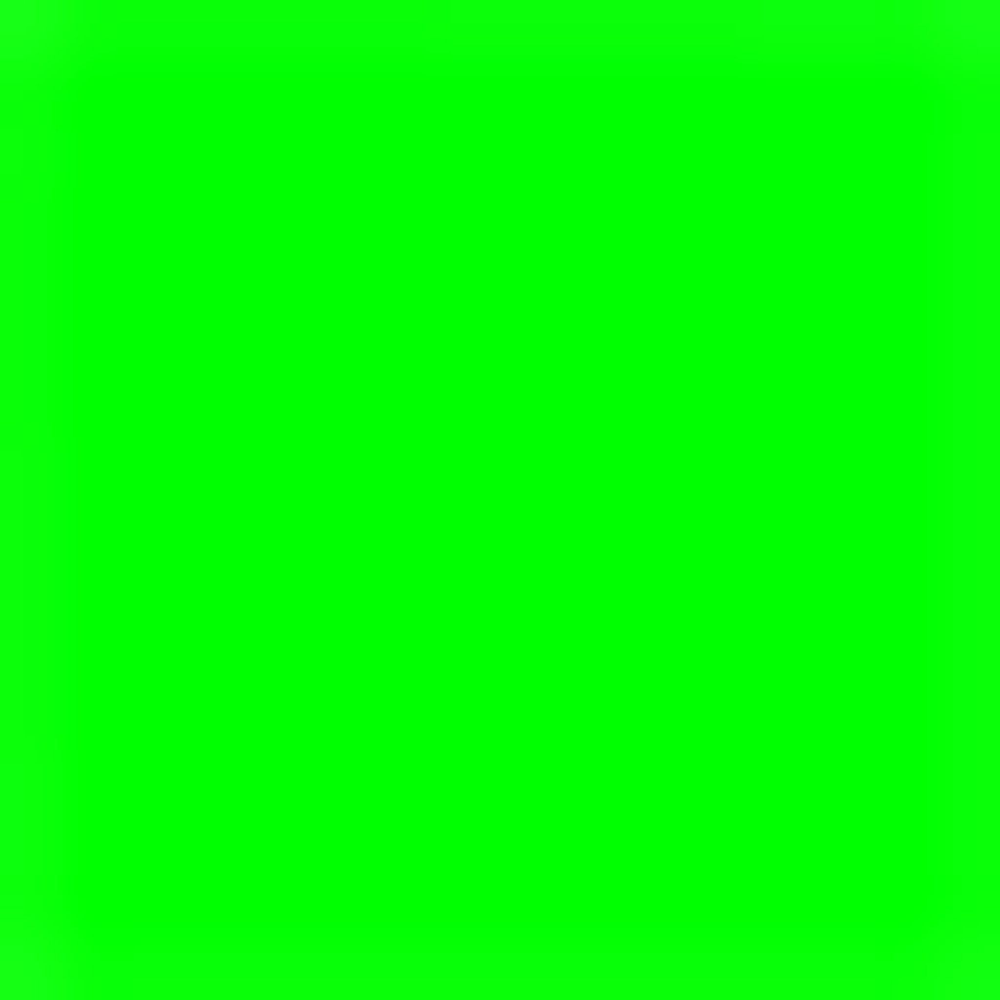


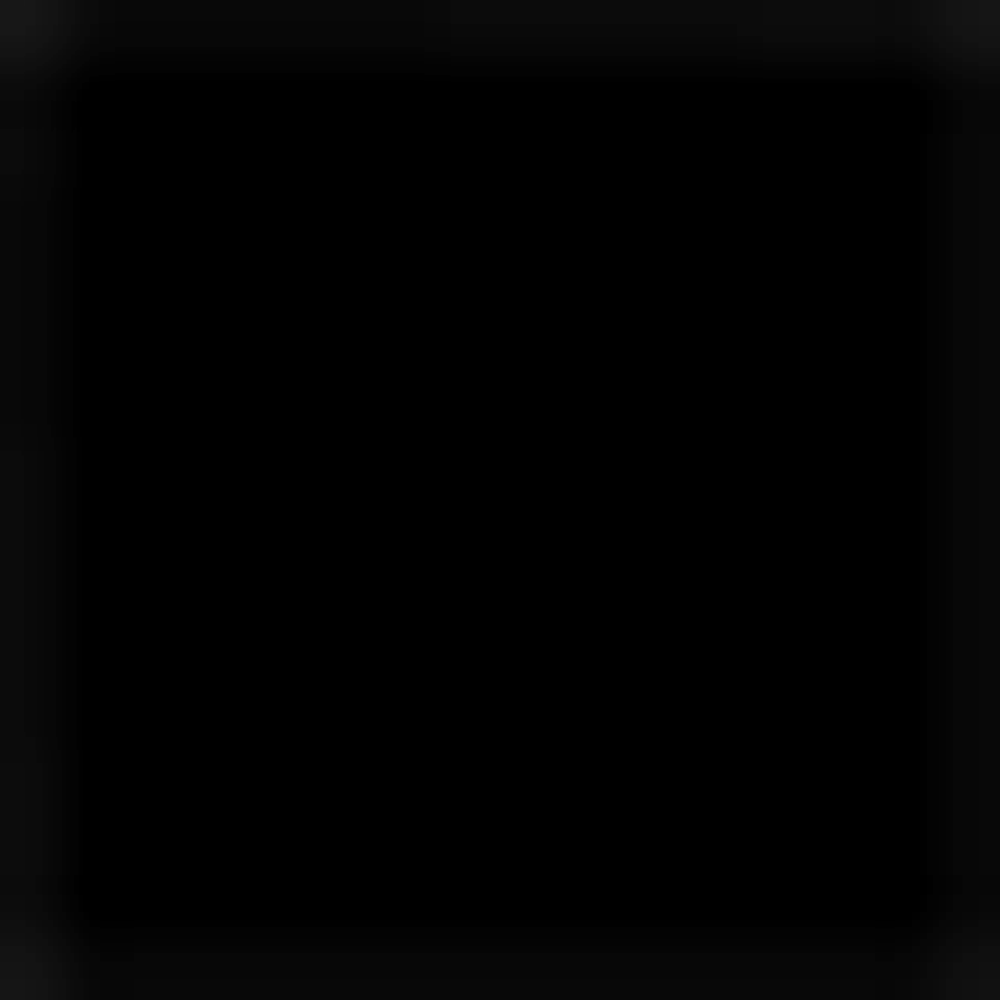

---- meta data -----
Clouds Impression
Peter Carolin
PNG
RGBA
Original size:  (320, 234)
Scaled size:  (2048, 1497)
-- images --



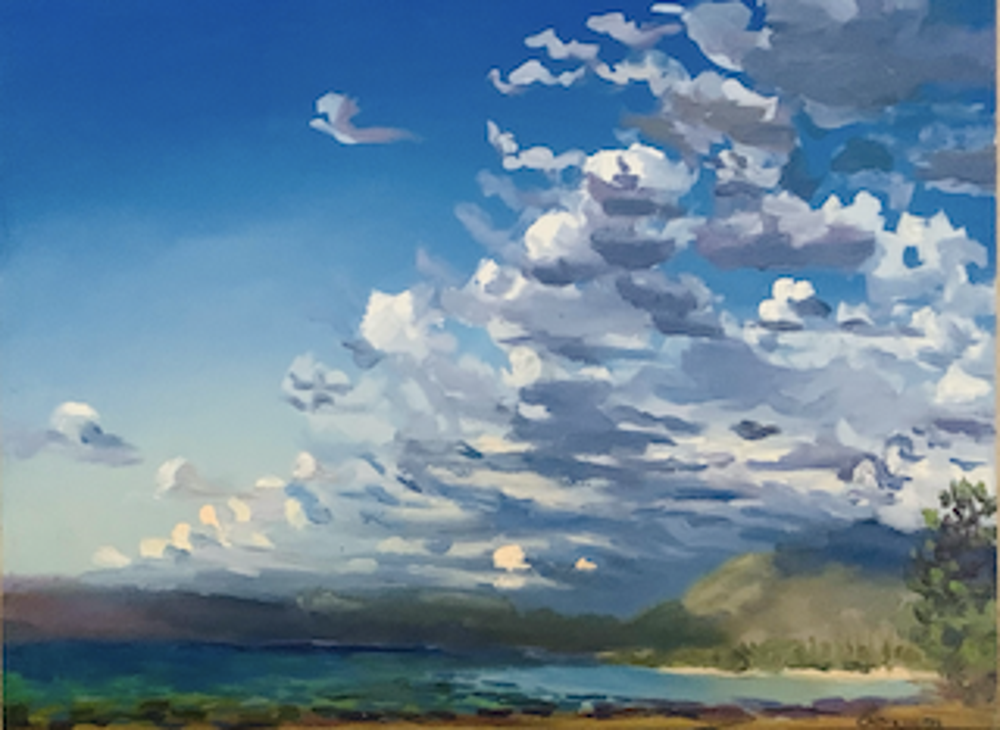


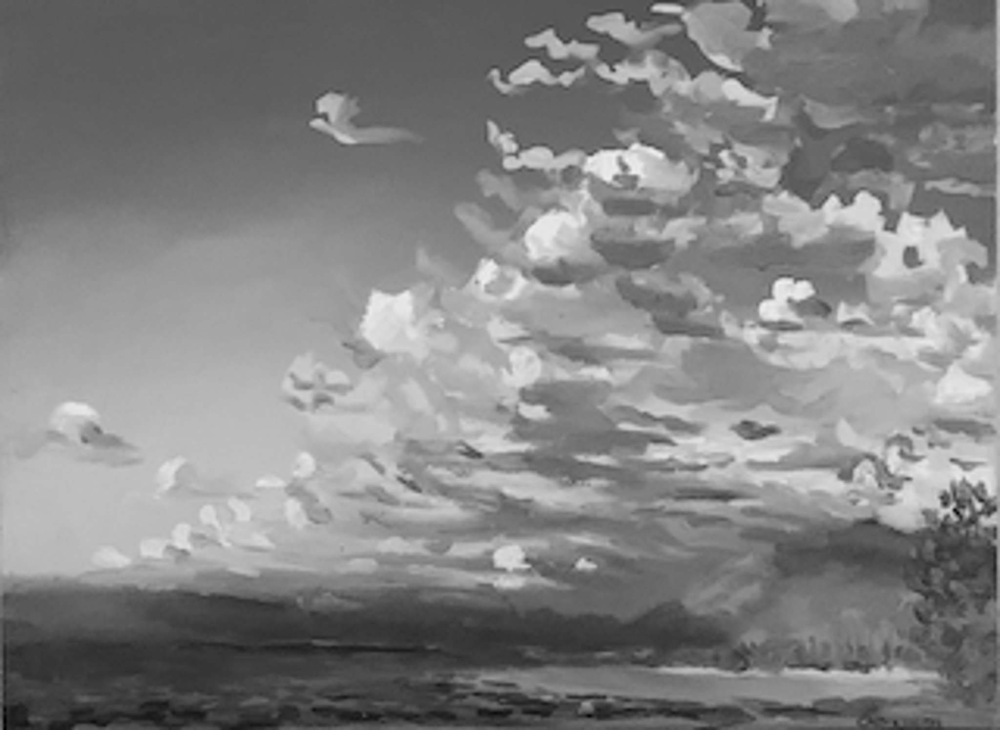


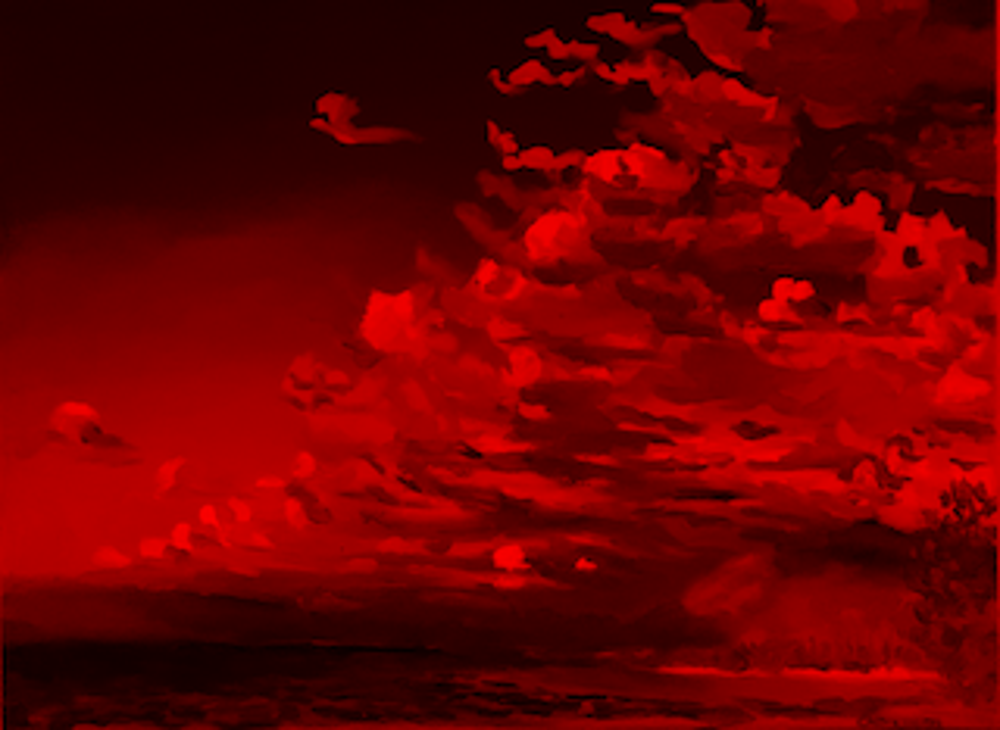


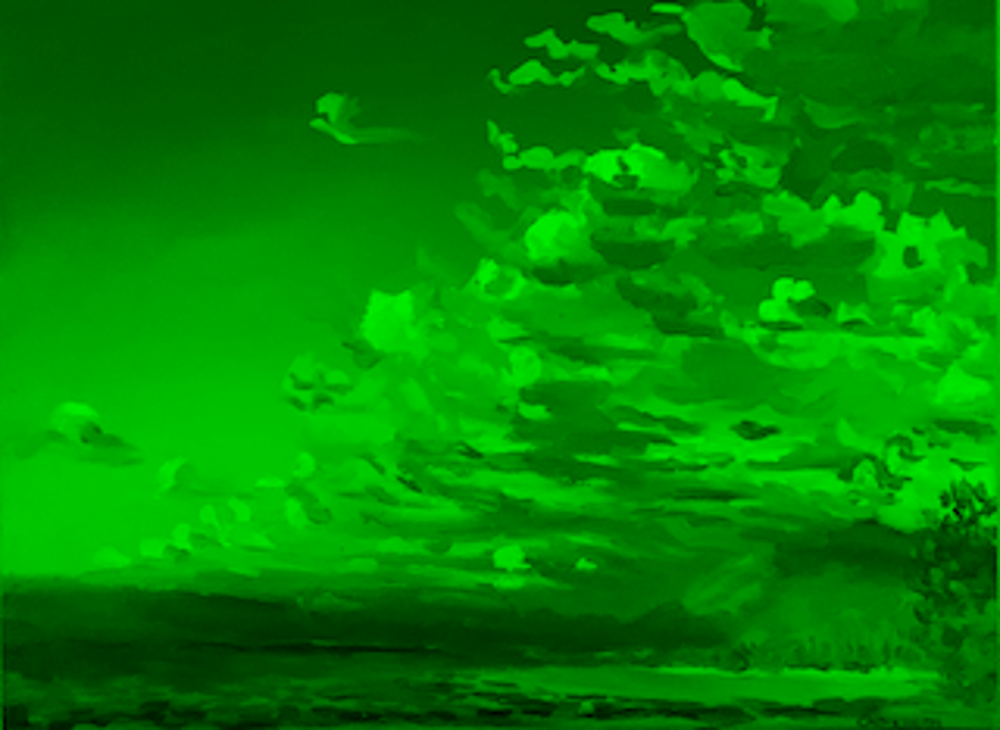


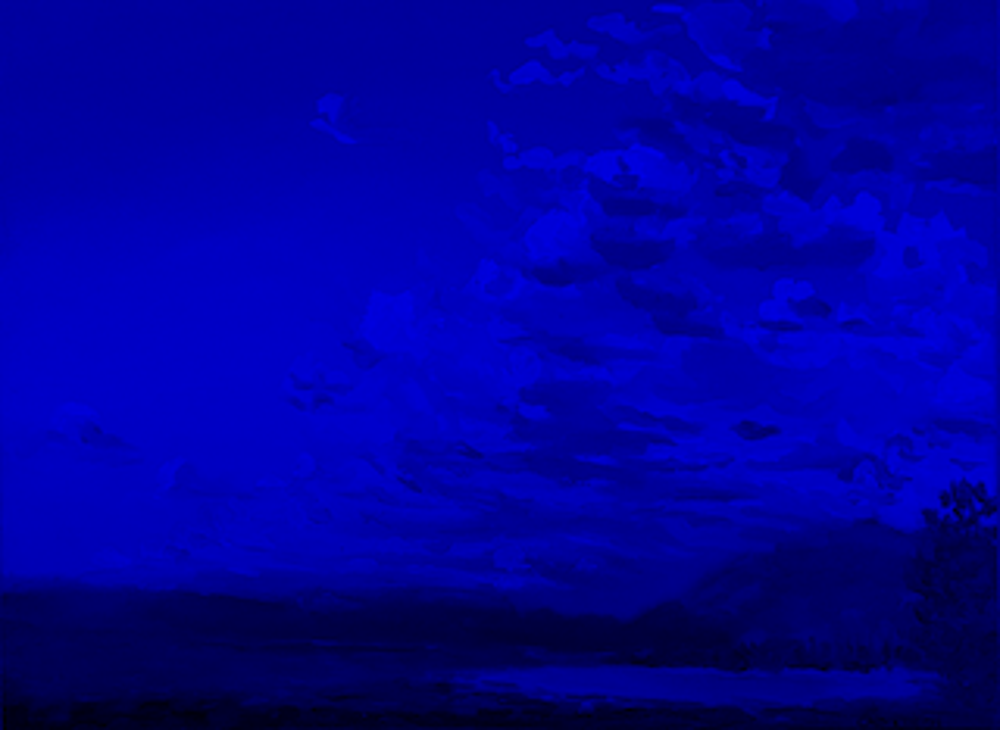

---- meta data -----
Lassen Volcano
Peter Carolin
JPEG
RGB
Original size:  (2792, 2094)
Scaled size:  (2048, 1536)
-- images --



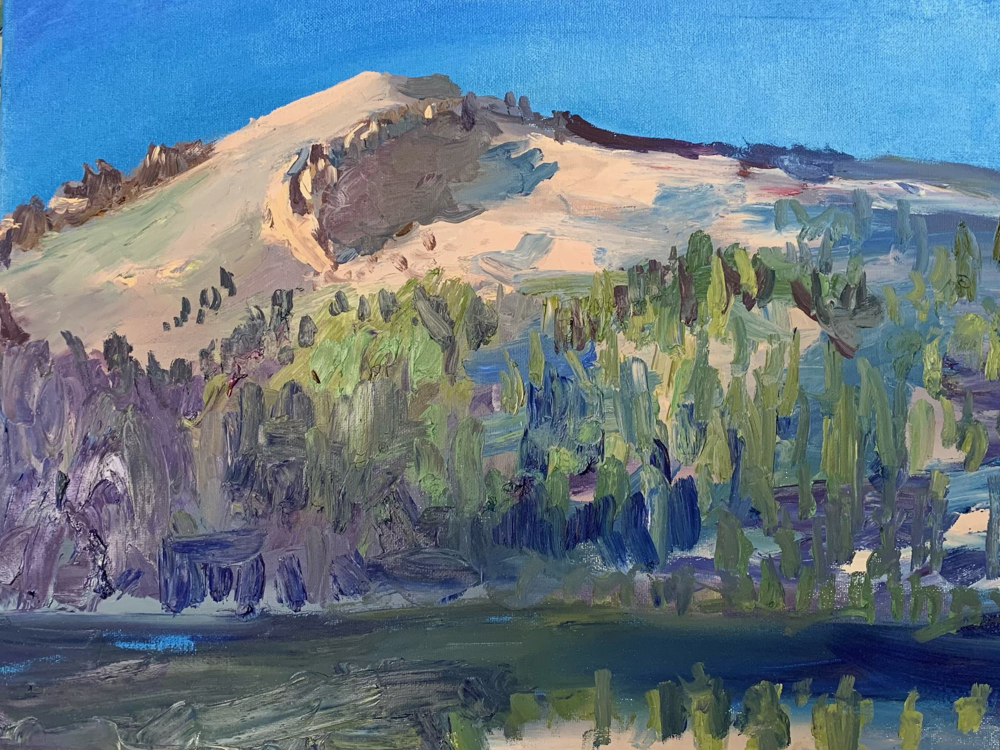


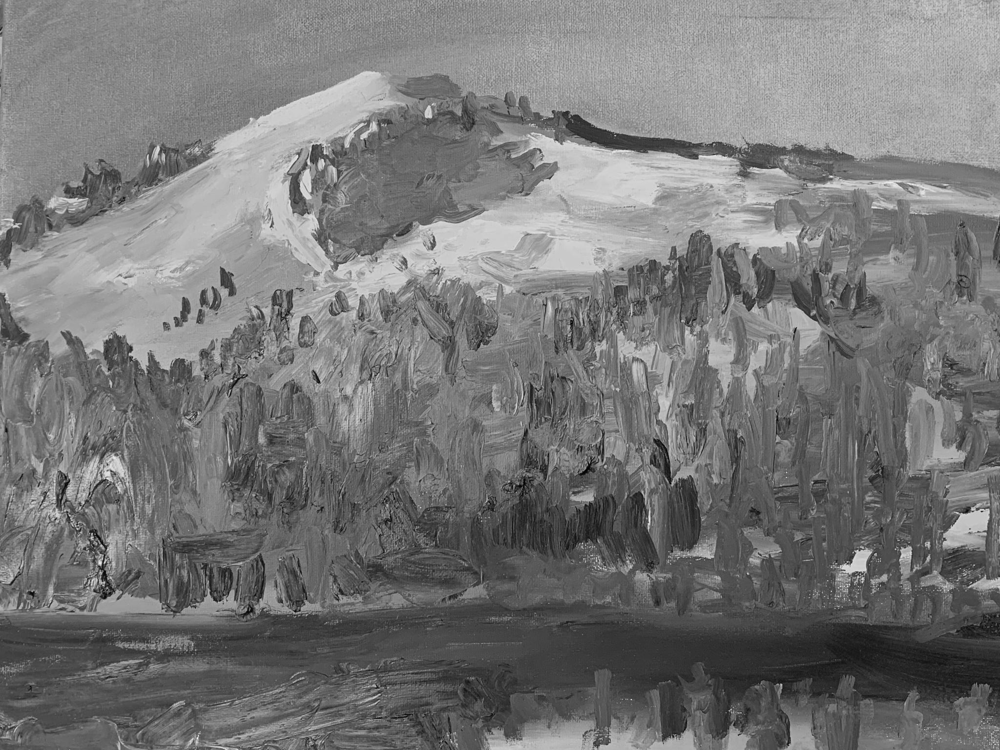


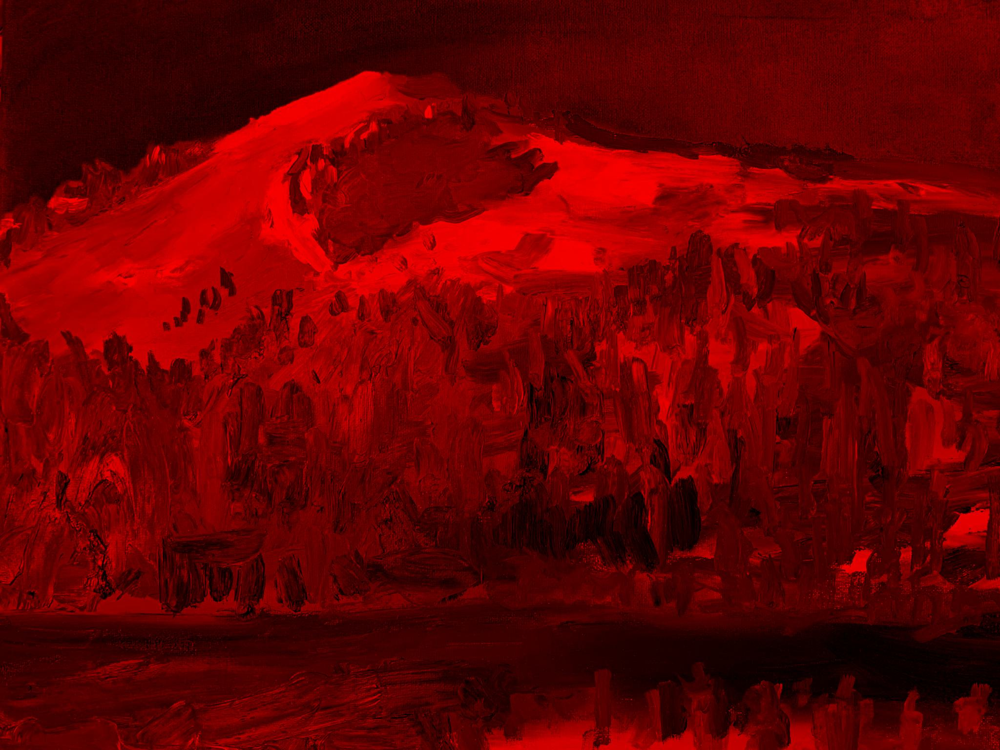


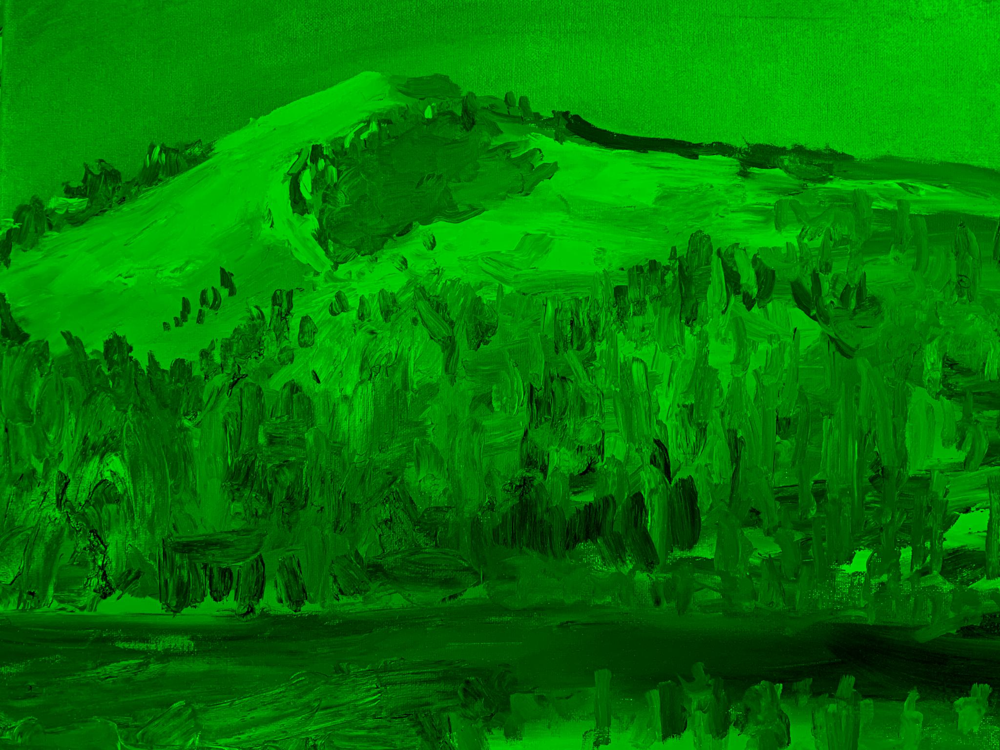


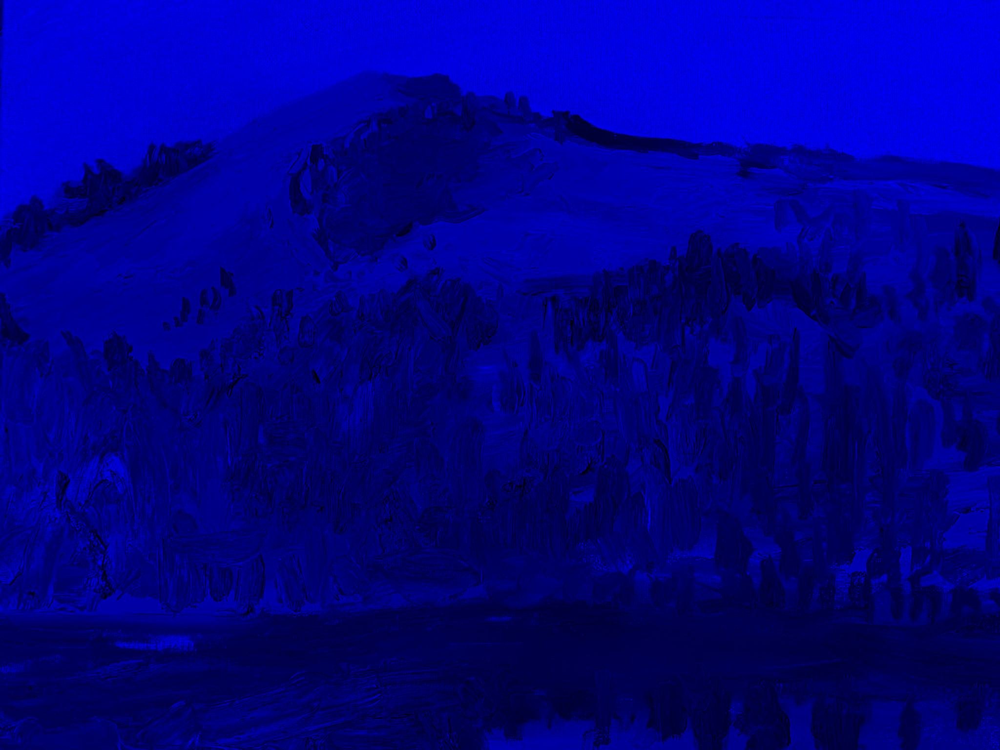

In [9]:
# Jupyter Notebook Visualization of Images
if __name__ == "__main__":
    # setup default images
    images = image_data()

    # Sequential Processing    
    for image in images:
        process_image(image)
        
    print()

## Parallel Computing

 > In parallel or concurrent mode, the ThreadPoolExecutor is used to submit each image to a separate worker thread, allowing multiple images to be processed simultaneously. Multithreading allows multiple concurrent tasks of a process at the same time. The executor.map() method is used to apply the process_image function to each image in the images list.  
 - The order in which the images are processed is not guaranteed, as threads are performed simultaneously.

---- meta data -----
Lassen Volcano
Peter Carolin
JPEG
RGB
Original size:  (2792, 2094)
Scaled size:  (2048, 1536)
-- images --



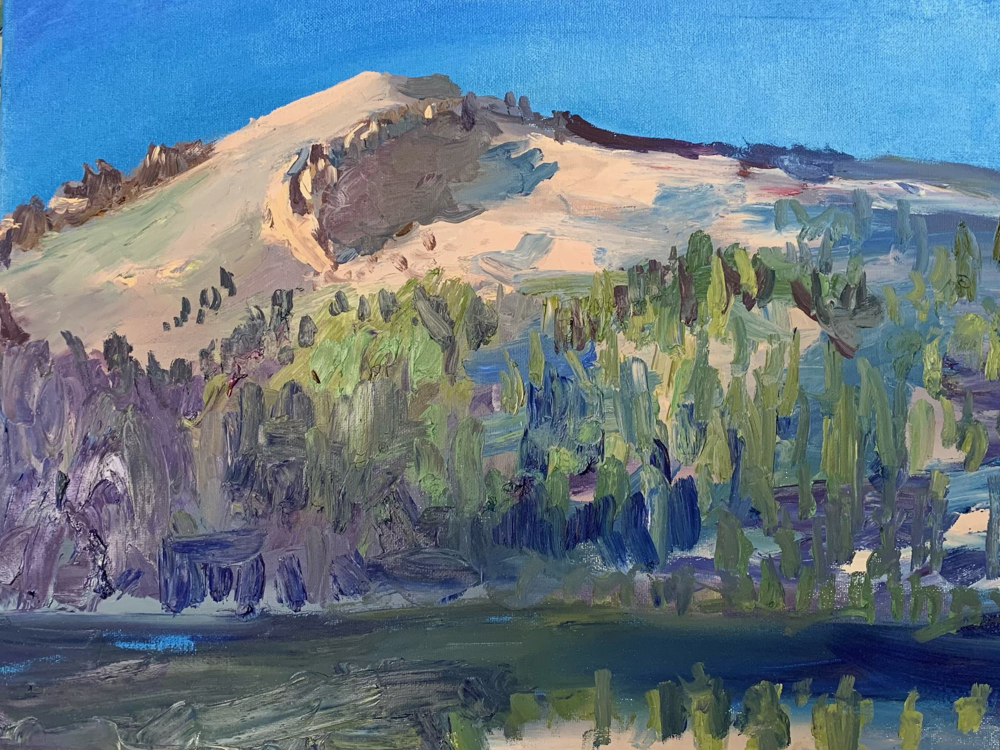


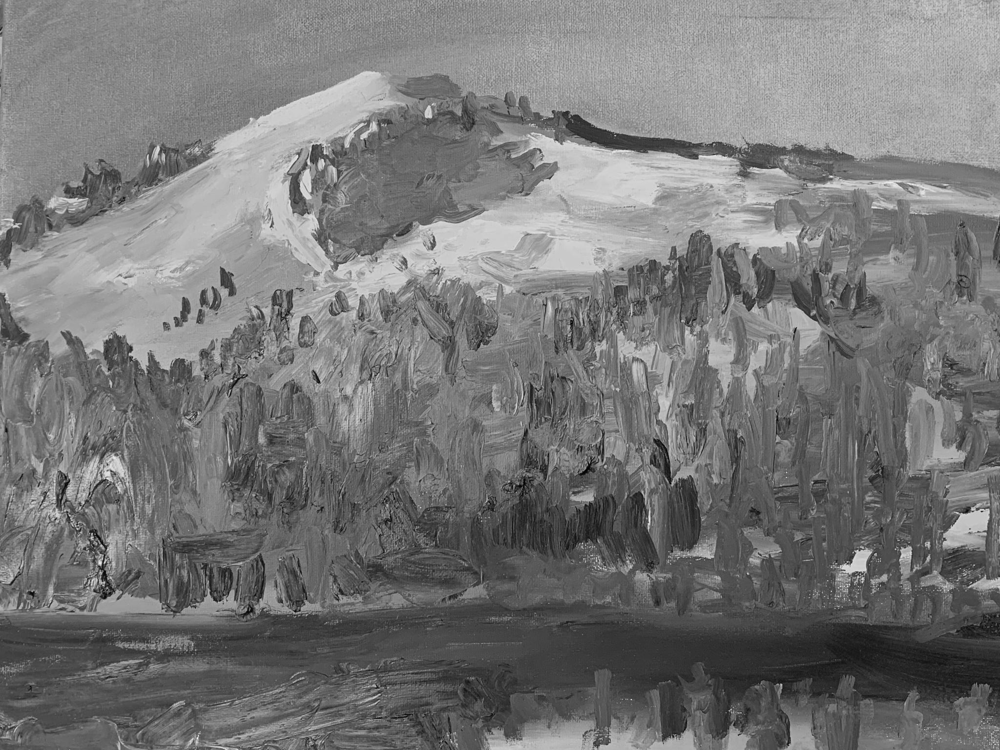


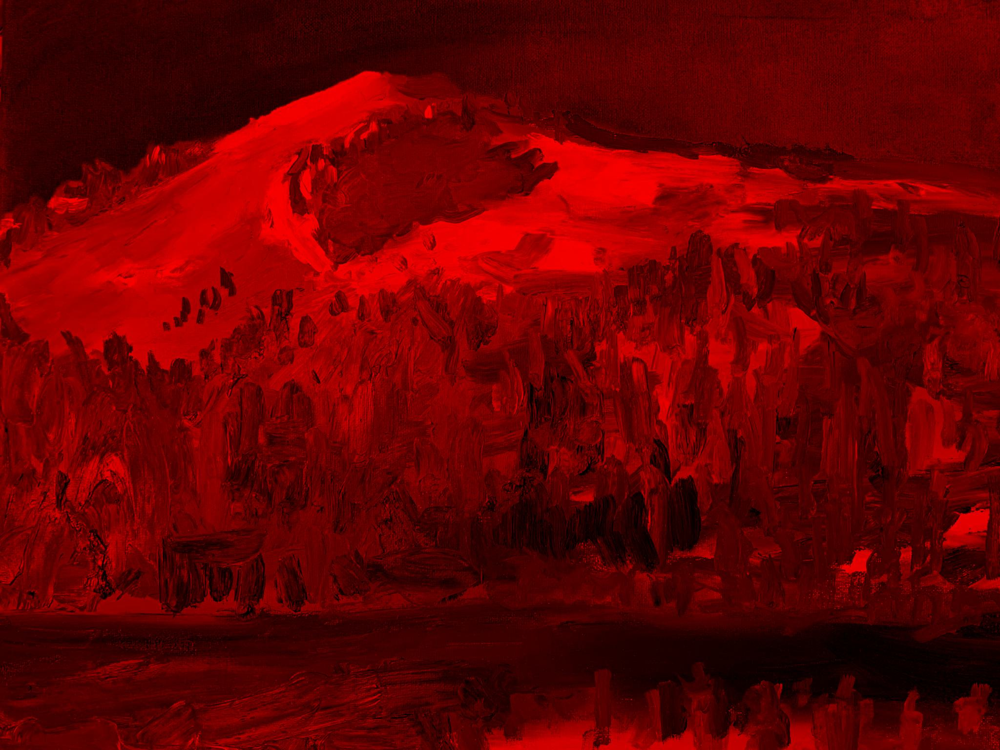


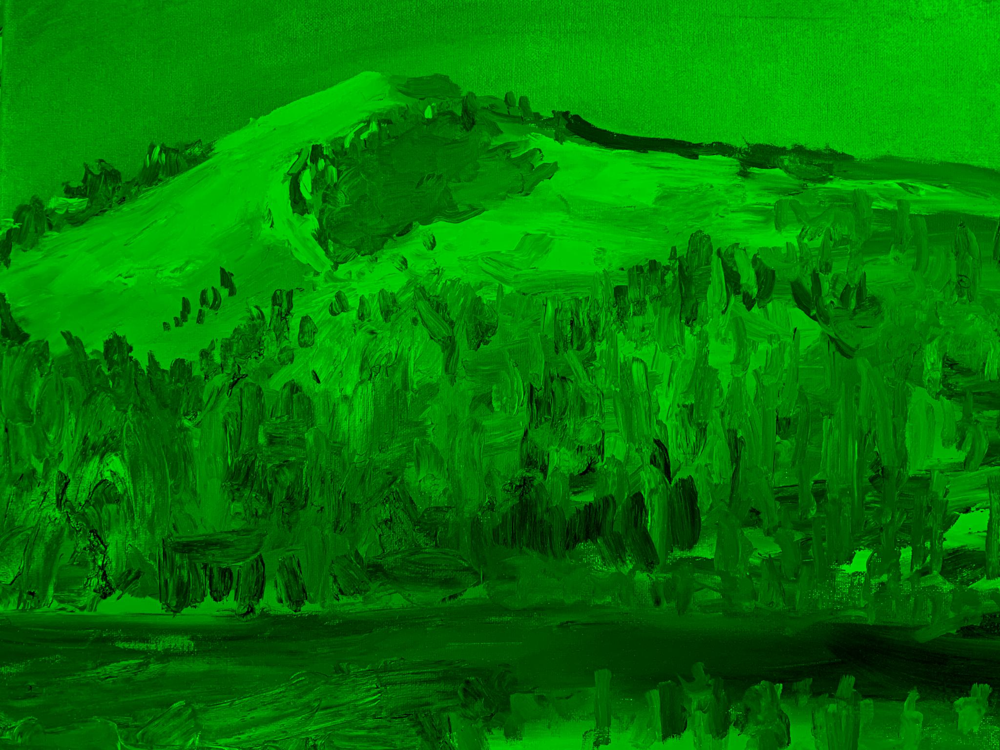


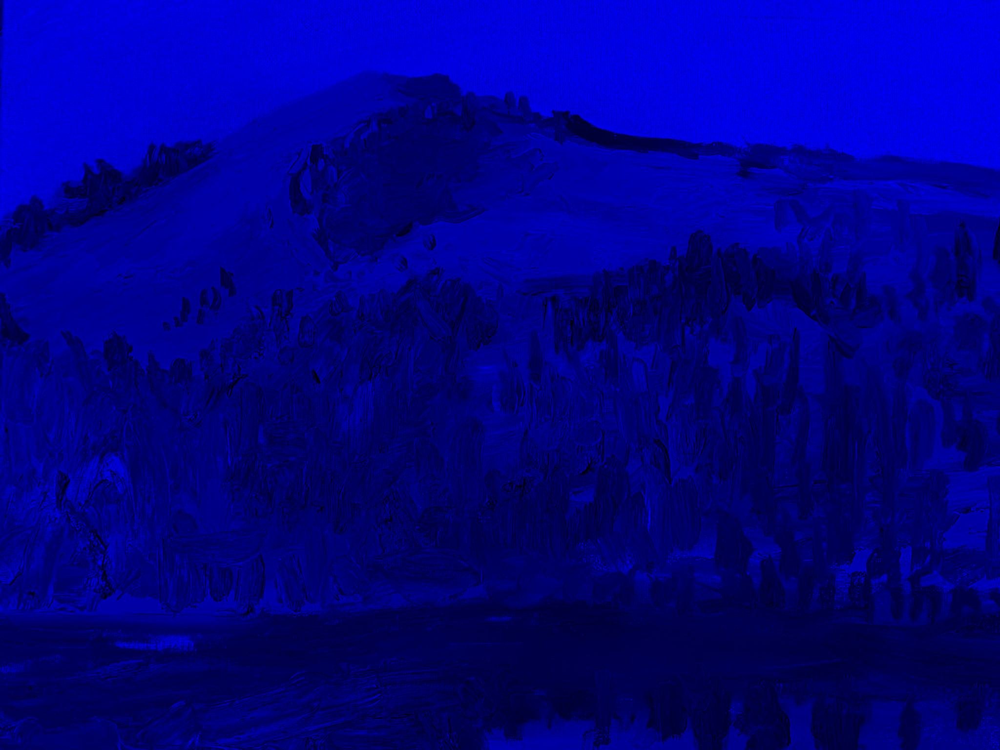

---- meta data -----
Clouds Impression
Peter Carolin
PNG
RGBA
Original size:  (320, 234)
Scaled size:  (2048, 1497)
-- images --



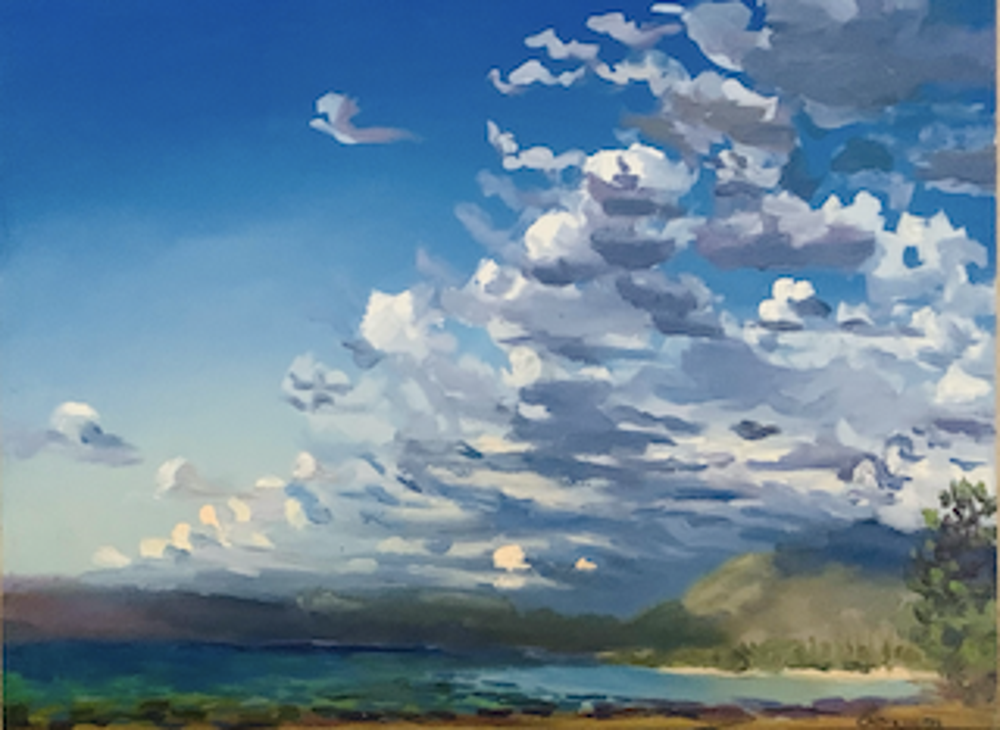


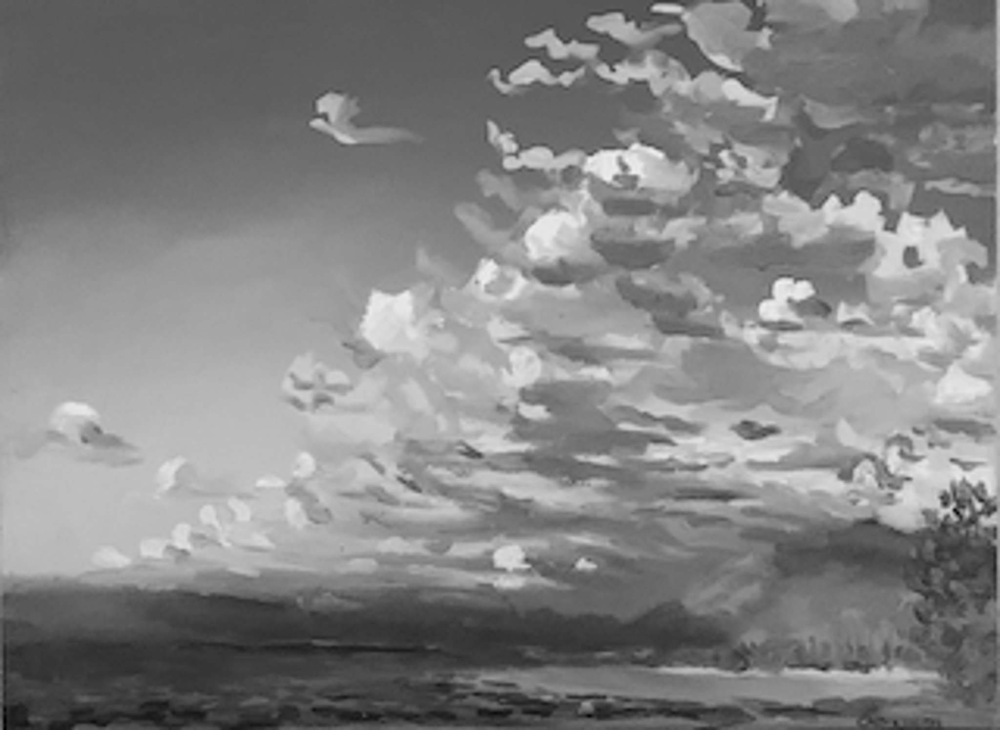


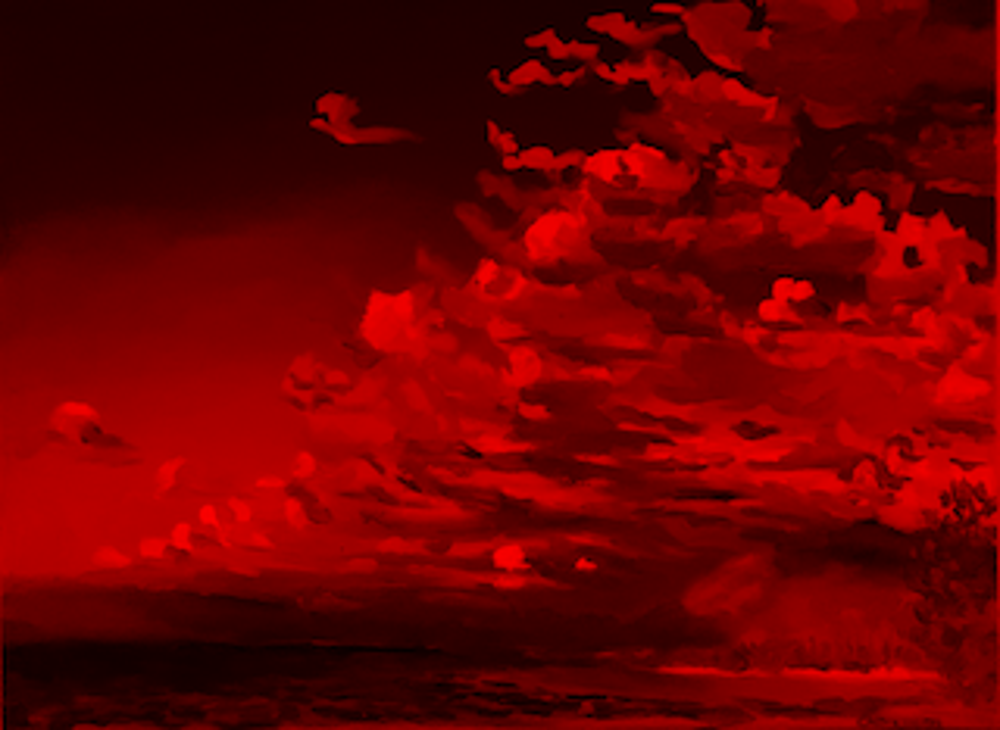


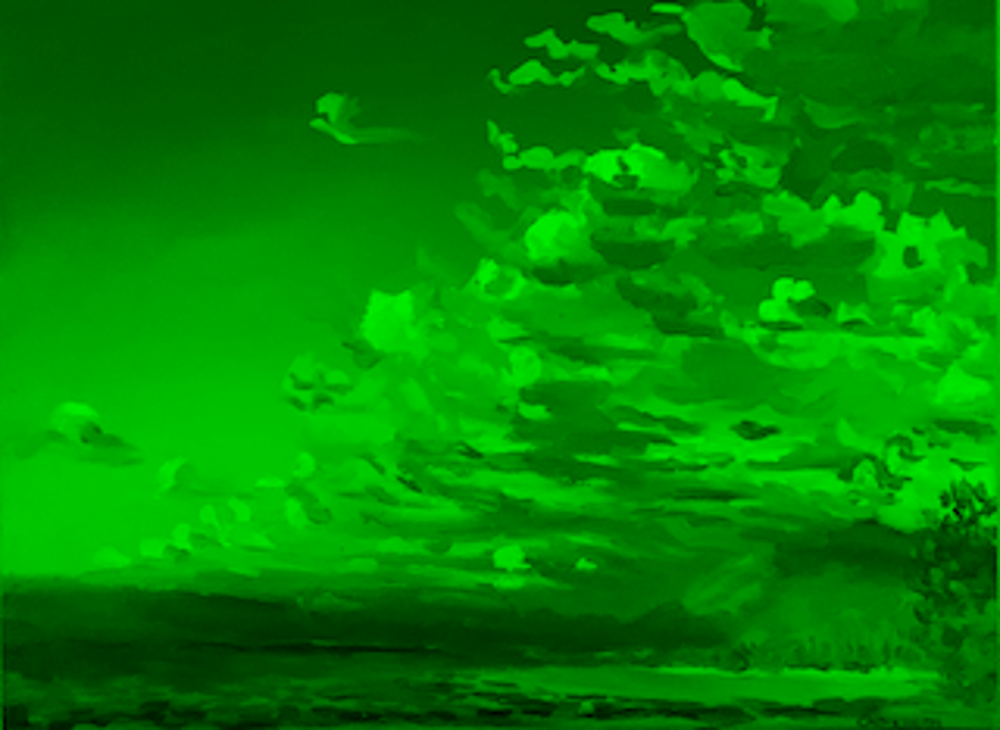


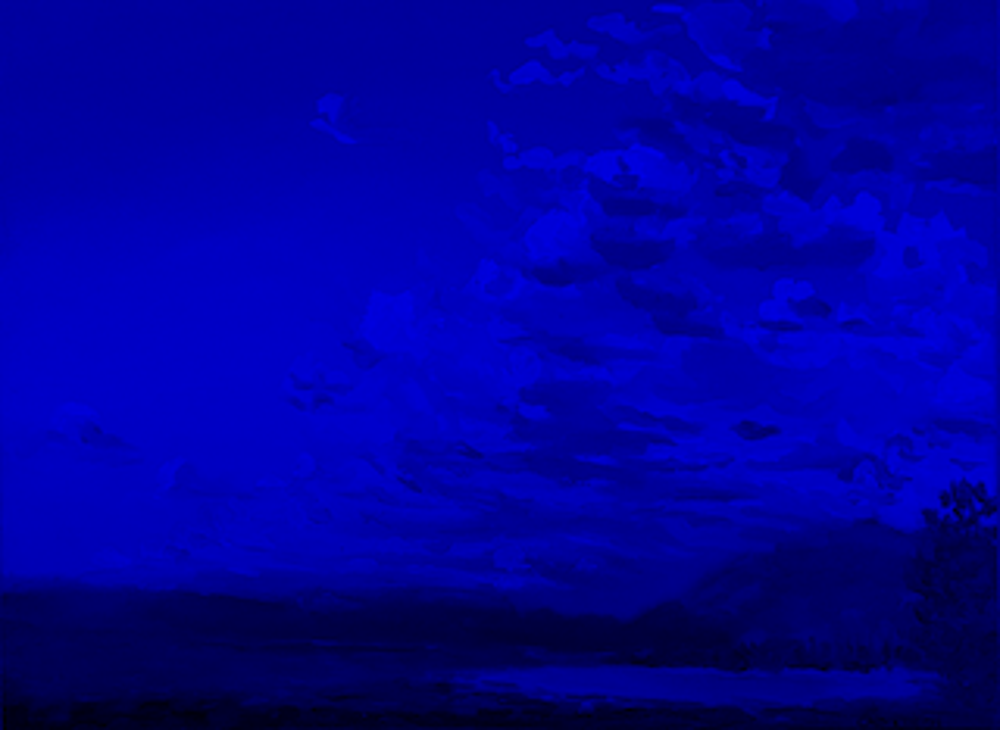

---- meta data -----
Green Square
Internet
PNG
RGBA
Original size:  (16, 16)
Scaled size:  (2048, 2048)
-- images --



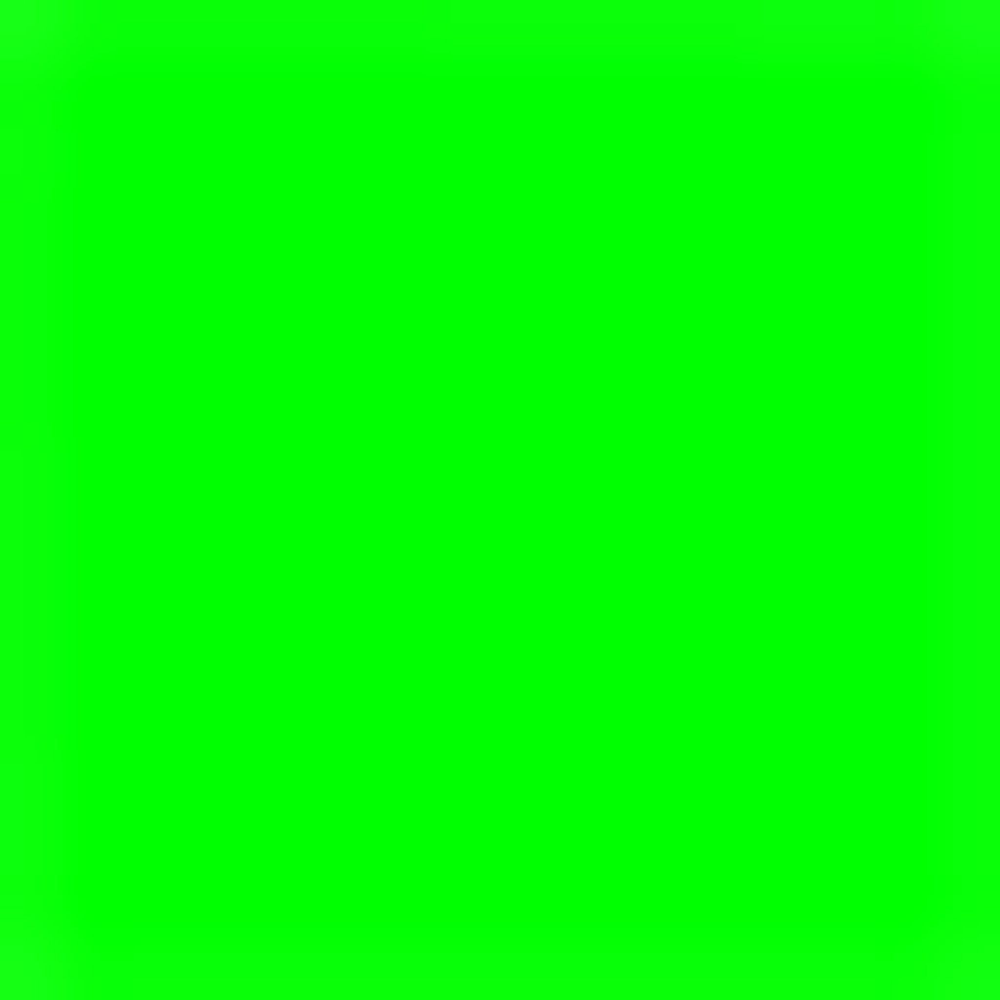


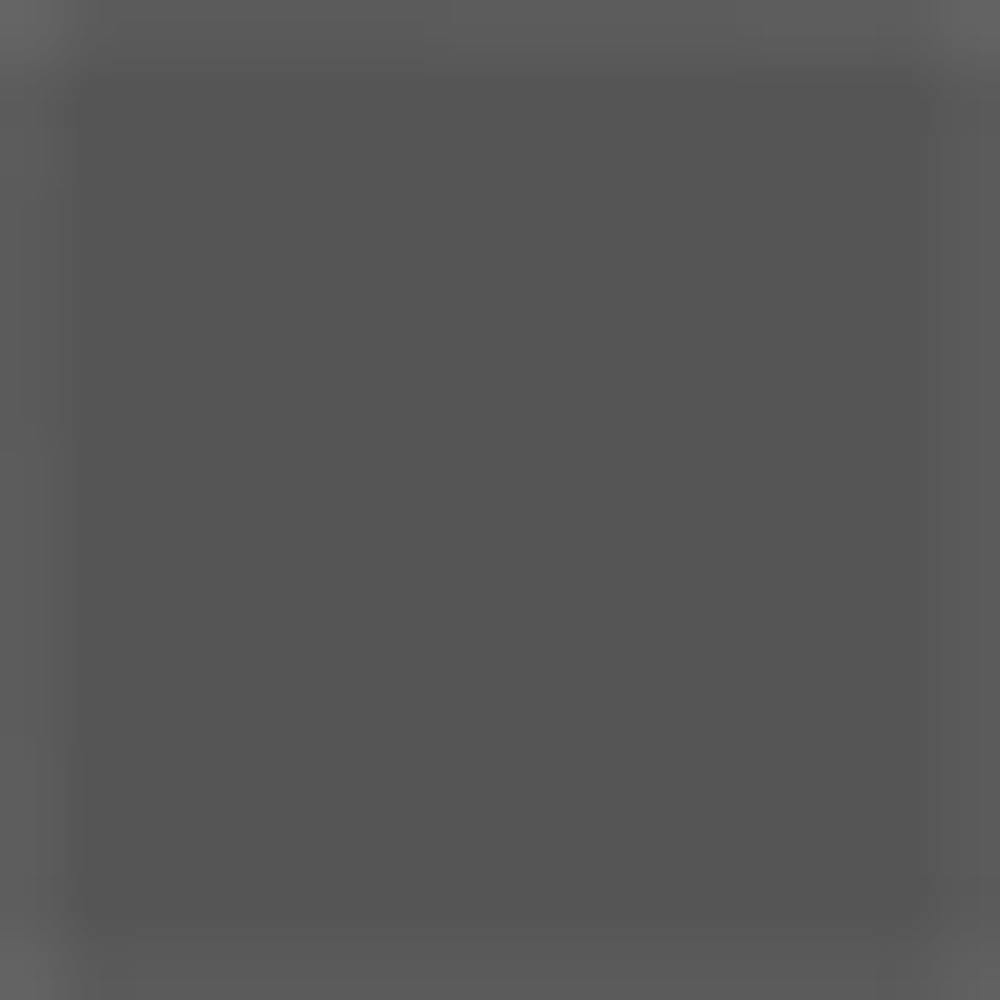


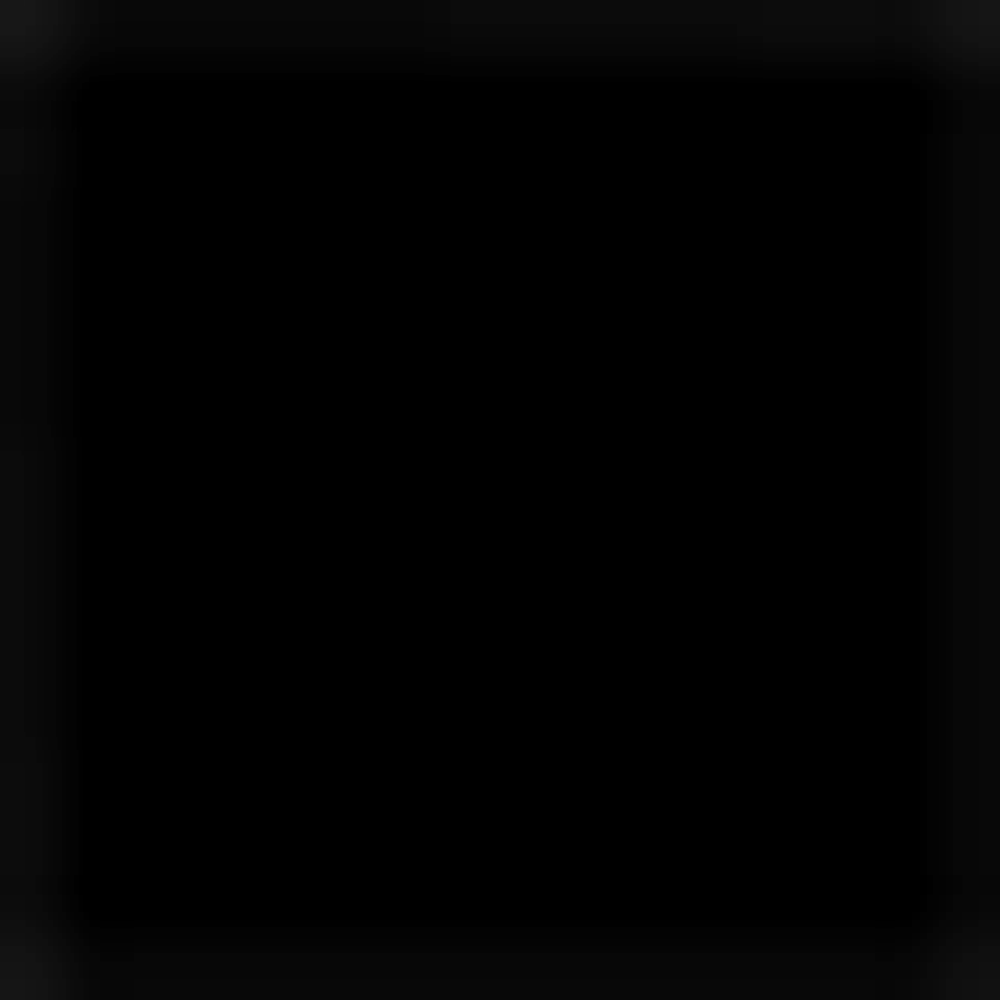


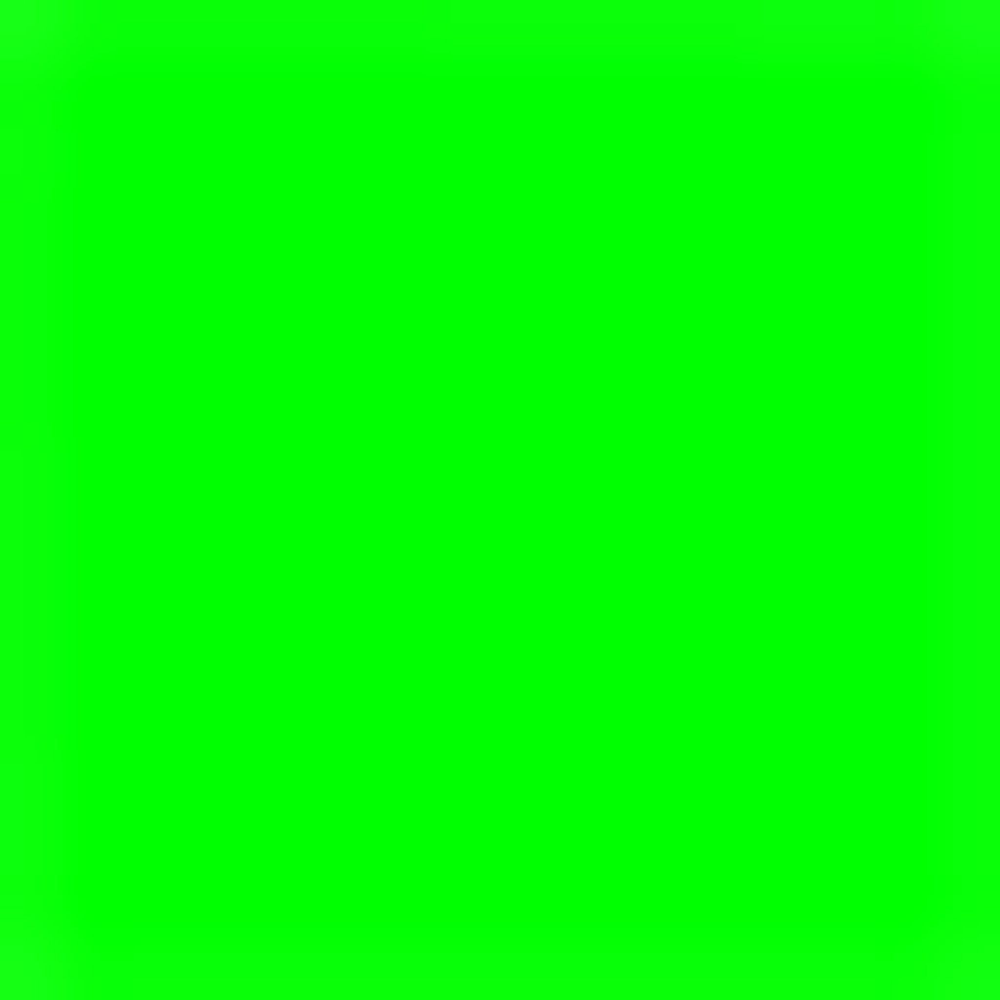


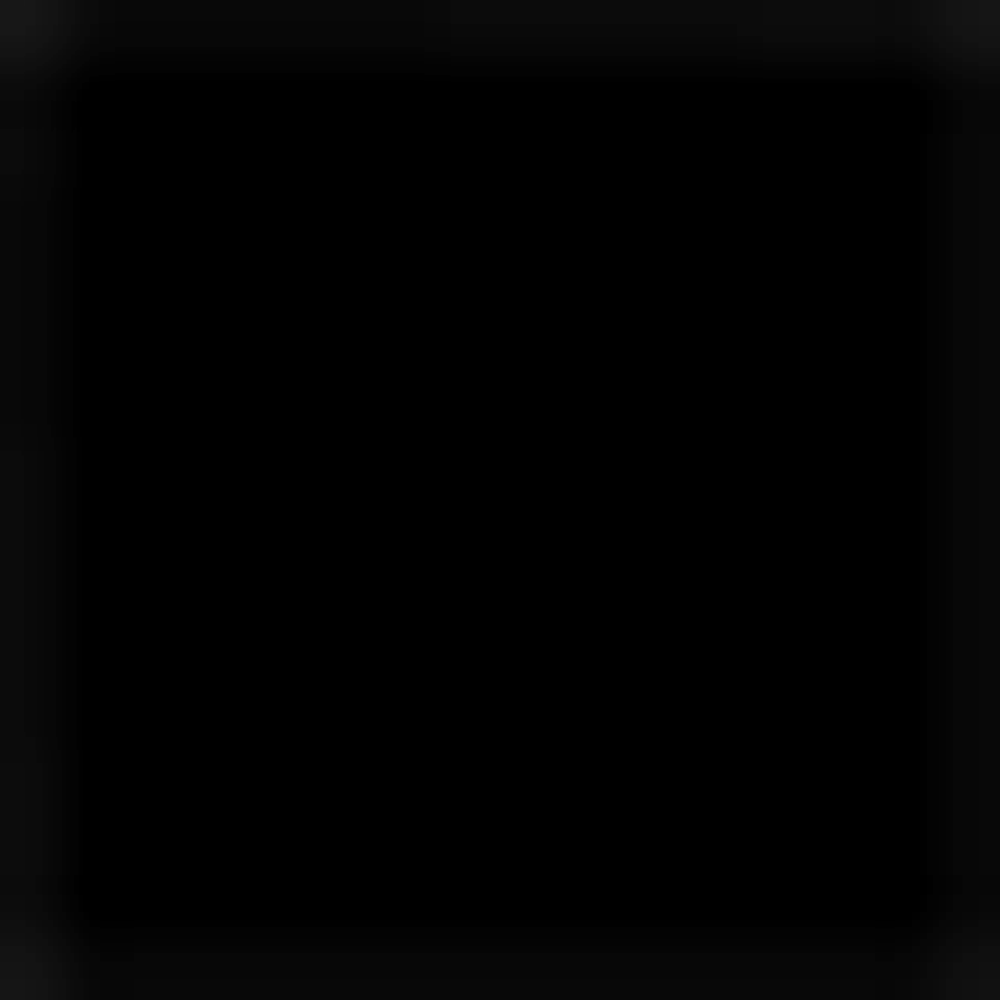

In [10]:
import concurrent.futures

# Jupyter Notebook Visualization of Images
if __name__ == "__main__":
    # setup default images
    images = image_data()
    
    # Parallel Processsing
    # executor allocates threads, it considers core execution capability of machine
    with concurrent.futures.ThreadPoolExecutor() as executor:
        executor.map(process_image, images)  # order is not predictable
        
    print()

## Observing Parallel Computing and Threads
> You can observe Processes, CPU Percentage, and Threads with Tools on your machine. Common tools to monitor performance are Activity Monitor on MacOS or Task Manager on Windows.   

- This example is using ```top``` launched in VSCode Terminal. (mac)
- Try ```top -H``` for linux.
![](images/top.png)
    - PID is Process ID.  
    - COMMAND is task running on machine.  Python is activated when running this Jupyter notebook.
    - #TH is number of threads.   This increases from 15/1 to 18/1 on my machine when running python parallel computing example.


## Hacks
> AP Classroom. Provide answers and thoughts on theoritical question form college board Video in section 4.3.  They start at about the 9 minute mark.
- Example 1

The answer to the first example is 50 seconds. This is because one proccessor can run proccess Y and Z and that will take 40 seconds. X is left to run on its own and will take 50 seconds. This means by the time all of them are done it will have taken 50 seconds.

- Example 2

The answer to this would be 25 seconds. This is because when the two proccesses are running parallel it will be 70 seconds. When the proccesses run both in parallel with yield a minimum time of 45 seconds. 70 - 45 = 25 seconds

> Data Structures.  Build a List Comprehension example
- list = [calc(item) for item in items]

In [2]:
folklore = [
    "the 1",
    "cardigan",
    "the last great american dynasty",
    "exile (feat. Bon Iver)",
    "my tears ricochet",
    "mirrorball",
    "seven",
    "august",
    "this is me trying",
    "illicit affairs",
    "invisible string",
    "mad woman",
    "epiphany",
    "betty",
    "peace",
    "hoax",
    "the lakes - bonus track",
]

In [3]:
newlist = [x for x in folklore if len(x) > 10]
print(newlist)

['the last great american dynasty', 'exile (feat. Bon Iver)', 'my tears ricochet', 'this is me trying', 'illicit affairs', 'invisible string', 'the lakes - bonus track']


In [8]:
for i, item in enumerate(folklore): # alternate the capital and lowercase
    if i % 2 == 0:
        folklore[i] = item.upper()
    else:
        folklore[i] = item.lower()
print(folklore)

['THE 1', 'cardigan', 'THE LAST GREAT AMERICAN DYNASTY', 'exile (feat. bon iver)', 'MY TEARS RICOCHET', 'mirrorball', 'SEVEN', 'august', 'THIS IS ME TRYING', 'illicit affairs', 'INVISIBLE STRING', 'mad woman', 'EPIPHANY', 'betty', 'PEACE', 'hoax', 'THE LAKES - BONUS TRACK']


In [9]:
folklore.reverse() # reverse the list
print(folklore)

['THE LAKES - BONUS TRACK', 'hoax', 'PEACE', 'betty', 'EPIPHANY', 'mad woman', 'INVISIBLE STRING', 'illicit affairs', 'THIS IS ME TRYING', 'august', 'SEVEN', 'mirrorball', 'MY TEARS RICOCHET', 'exile (feat. bon iver)', 'THE LAST GREAT AMERICAN DYNASTY', 'cardigan', 'THE 1']
